In [5]:
using Distributions
using StatsPlots
using StatsBase
using LaTeXStrings
using CSV
using DataFrames
using LinearAlgebra
using Logging
using Random
using Turing
using StatisticalRethinking

# setting default attributes for plots
default(label=false)
Logging.disable_logging(Logging.Warn);

In [6]:
# Install BSplines
# import Pkg; Pkg.add("BSplines");

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`


Install Pairplots.jl
- https://sefffal.github.io/PairPlots.jl/dev/guide/https://sefffal.github.io/PairPlots.jl/dev/guide/
- https://juliahub.com/ui/Packages/General/PairPlots

In [7]:
# Pkg.add(["CairoMakie", "PairPlots"]);

# 4.1 Why normal distributions are normal

## Code 4.1

  0.000080 seconds (3 allocations: 125.109 KiB)
size(n) = (1000, 16)
  3.176264 seconds (5.69 M allocations: 355.906 MiB, 6.00% gc time, 98.91% compilation time: 64% of which was recompilation)


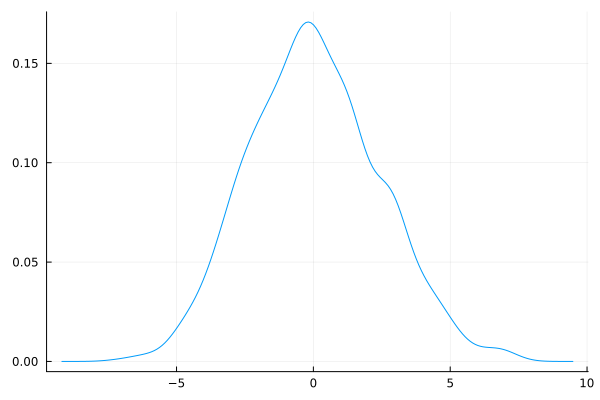

In [8]:
# equivalent to R runif(): random sample 16 times from a uniform distribution (-1,1)
@time n = rand(Uniform(-1, 1), 1000, 16);
@show size(n)
pos = sum.(eachrow(n));
@time density(pos)

## Code 4.2

In [9]:
@time prod(1 .+ rand(Uniform(0, .1), 12))

  0.000021 seconds (2 allocations: 320 bytes)


2.039655646512889

## Code 4.3

  0.091346 seconds (65.47 k allocations: 4.558 MiB, 96.82% compilation time)
  1.180835 seconds (1.87 M allocations: 112.847 MiB, 4.55% gc time, 99.38% compilation time: 28% of which was recompilation)


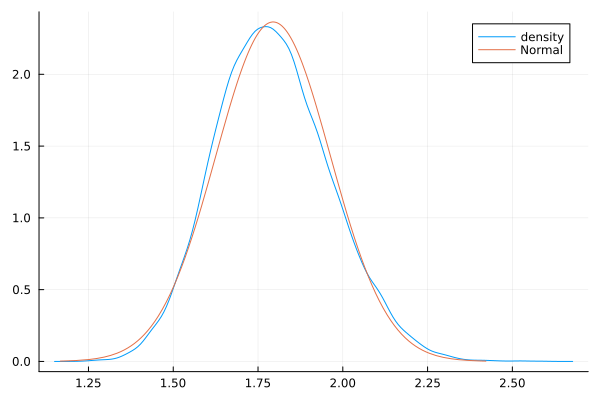

In [10]:
u = Uniform(0, .1)
growth = prod.(eachrow(1 .+ rand(u, 10000, 12)));

@time density(growth; label="density")
# overlay normal distribution
μ = mean(growth)
σ = std(growth)
@time plot!(Normal(μ, σ); label="Normal")

## Code 4.4

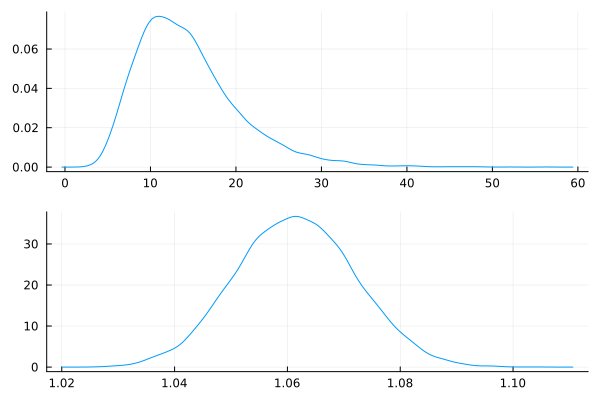

In [11]:
big = prod.(eachrow(1 .+ rand(Uniform(0, 0.5), 10000, 12)));
small = prod.(eachrow(1 .+ rand(Uniform(0, 0.01), 10000, 12)));
density([big, small]; layout=(2, 1))

## Code 4.5

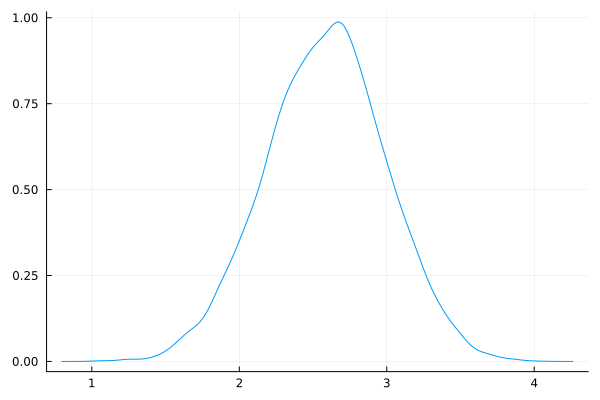

In [12]:
density(log.(big))

# 4.2 A language for describing models

## Code 4.6 Grid-search to calculate posterior

In [13]:
w = 6
n = 9
p_grid = range(0, 1; length=100)
bin_dens = [pdf(Binomial(n, p), w) for p in p_grid]
uni_dens = [pdf(Uniform(0, 1), p) for p in p_grid];
posterior = bin_dens .* uni_dens
posterior /= sum(posterior);

In [14]:
posterior

100-element Vector{Float64}:
 0.0
 8.741893987914909e-12
 5.425284098722297e-10
 5.990575360568051e-9
 3.261805587160897e-8
 1.2053991899464767e-7
 3.485649034505518e-7
 8.509009932076811e-7
 1.834811305202922e-6
 3.598403772645905e-6
 6.547828990010935e-6
 1.1213248218015673e-5
 1.826301780861177e-5
 ⋮
 0.0057411830876240195
 0.004616016455259013
 0.0035984037726459104
 0.0027005089649864604
 0.0019317387539326666
 0.0012980121298369258
 0.0008009482246260066
 0.00043696727582688777
 0.00019629917341509366
 6.189387892791484e-5
 8.227800686273486e-6
 0.0

# 4.3 Gaussian model of height

## Code 4.7 Load data/Howell1.csv

In [197]:
d_howell = DataFrame(CSV.File("data/Howell1.csv"));

In [198]:
d_howell

Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [199]:
size(d_howell)

(544, 4)

## Code 4.8 Describe the dataset

In [200]:
describe(d_howell)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,138.264,53.975,148.59,179.07,0,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,0,Float64
3,age,29.3444,0.0,27.0,88.0,0,Float64
4,male,0.472426,0,0.0,1,0,Int64


In [19]:
parentmodule(describe)

DataAPI

## Code 4.9 summarize the dataset and draw distributions

In [20]:
precis(d_howell)

┌────────┬────────────────────────────────────────────────────────────┐
│  param │    mean      std     5.5%      50%    94.5%      histogram │
├────────┼────────────────────────────────────────────────────────────┤
│ height │ 138.264  27.6024  81.1086   148.59  165.735  ▁▁▁▂▂▂▂▂▂██▆▁ │
│ weight │ 35.6106  14.7192   9.3607  40.0578  54.5029  ▁▃▄▄▃▂▃▆██▅▃▁ │
│    age │ 29.3444  20.7469      1.0     27.0   66.135      █▆▆▆▆▃▃▁▁ │
│   male │  0.4724   0.4997      0.0      0.0      1.0    █▁▁▁▁▁▁▁▁▁█ │
└────────┴────────────────────────────────────────────────────────────┘


## Code 4.10 Distribution of height

In [21]:
d_howell.height

544-element Vector{Float64}:
 151.765
 139.7
 136.525
 156.845
 145.415
 163.83
 149.225
 168.91
 147.955
 165.1
 154.305
 151.13
 144.78
   ⋮
 156.21
 152.4
 162.56
 114.935
  67.945
 142.875
  76.835
 145.415
 162.56
 156.21
  71.12
 158.75

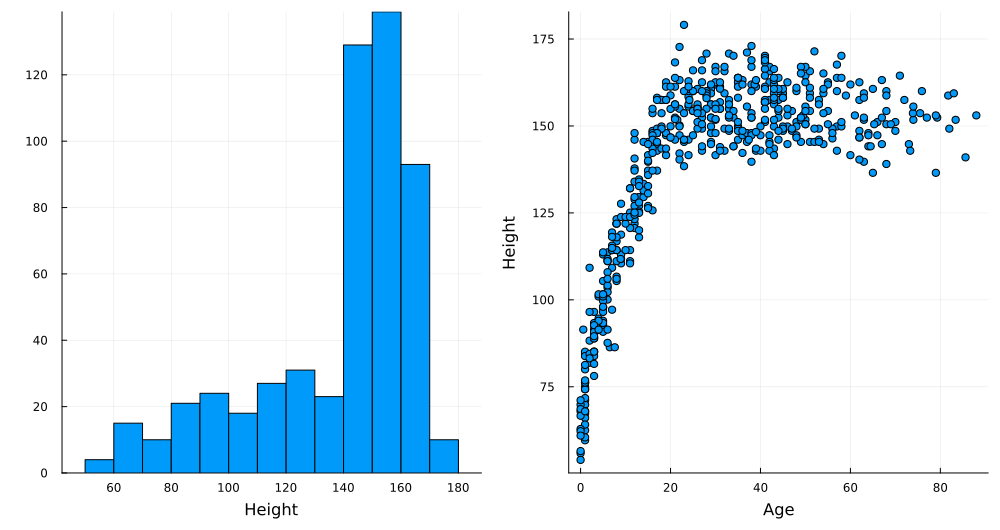

In [22]:
h_of_height = histogram(d_howell.height, xaxis="Height")
s_age_vs_height = scatter(d_howell.age, d_howell.height, xaxis="Age", yaxis="Height", legend=false)

plot(h_of_height, s_age_vs_height, layout=(1,2), left_margin=5*Plots.mm, 
    bottom_margin=5*Plots.mm, size=(1000,530) ) 

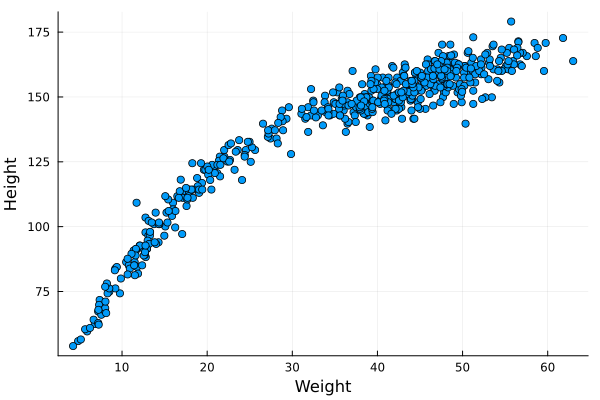

In [201]:
s_height_vs_weight = scatter(d_howell.weight, d_howell.height, xaxis="Weight", yaxis="Height", legend=false)


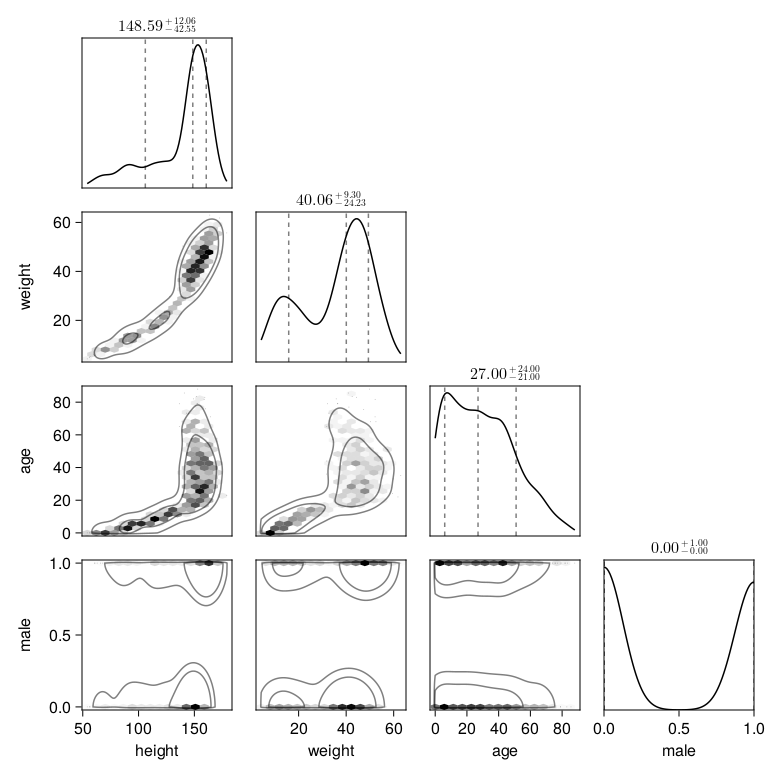

In [23]:
using CairoMakie
using PairPlots

pairplot(d)

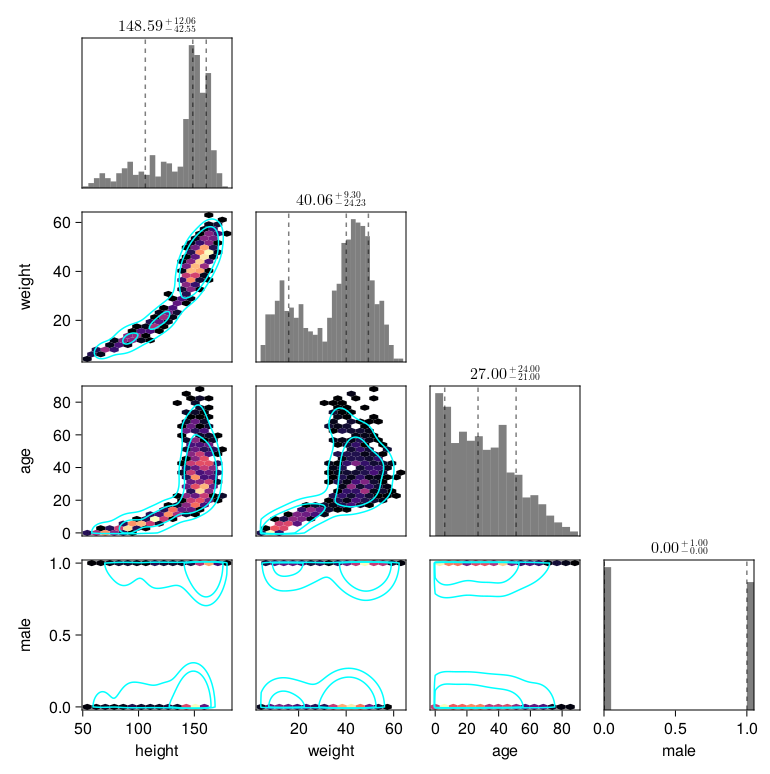

In [24]:
pairplot(
    d => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.11  select individuals with age>=18

In [25]:
d2 = d[d.age .>= 18,:];

In [26]:
size(d2)

(352, 4)

## Code 4.12 Draw the prior for $\mu$

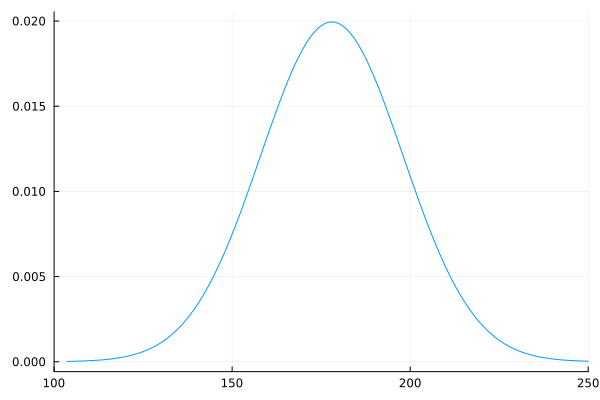

In [27]:
plot(Normal(178, 20); xlim=(100, 250))

## Code 4.13 Draw the prior of $\sigma$

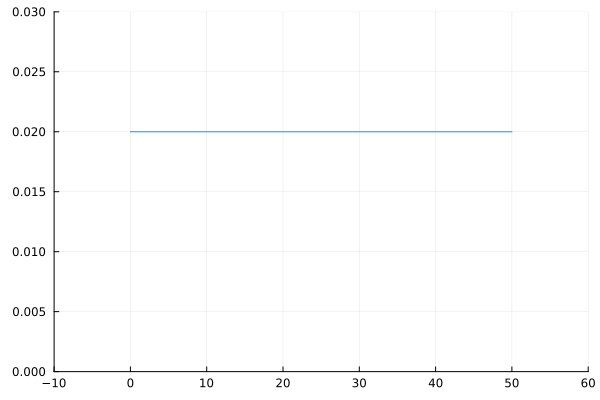

In [28]:
plot(Uniform(0, 50), xlim=(-10, 60), ylim=(0, 0.03))

## Code 4.14 Prior predictive simulation for the height model

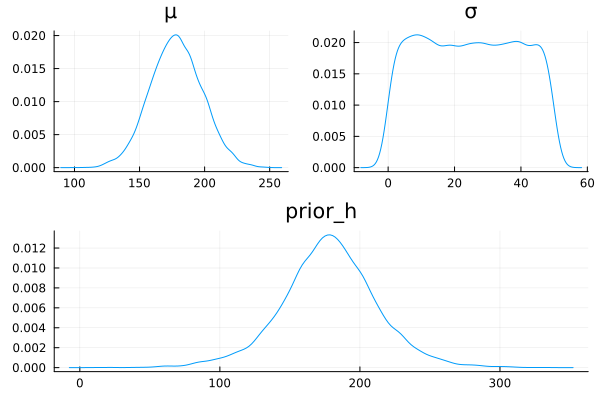

In [29]:
n = 10_000
sample_μ = rand(Normal(178, 20), n)
sample_σ = rand(Uniform(0, 50), n);
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

p1 = density(sample_μ; title="μ")
p2 = density(sample_σ; title="σ")
p3 = density(prior_h; title="prior_h")

plot(p1, p2, p3, layout=@layout [a b; c])

## Code 4.15. Restrict the predictive simulation to 0-272cm.

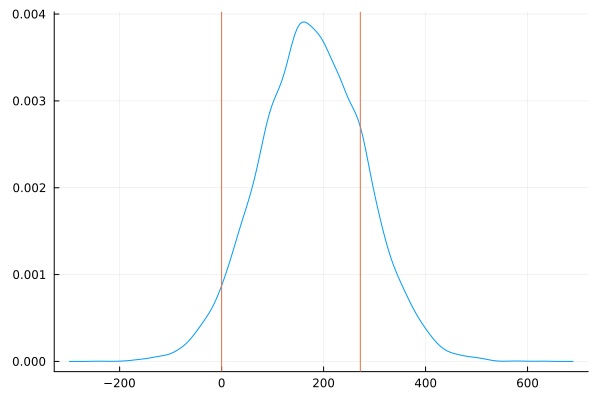

In [30]:
sample_μ = rand(Normal(178, 100), n)
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

density(prior_h)
vline!([0, 272])

## Code 4.16 Grid-search: Calculate posterior of $\mu$ and $\sigma$ using logpdf()

In [31]:
μ_list = range(150, 160; length=100)
σ_list = range(7, 9; length=100)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d2.height))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
];

max_prod = maximum(log_prod)
prob = @. exp(log_prod - max_prod);

In [32]:
@show size(log_likelihood)
@show size(log_prod)
@show size(prob)


size(log_likelihood) = (100, 100)
size(log_prod) = (100, 100)
size(prob) = (100, 100)


(100, 100)

In [33]:
prob

100×100 Matrix{Float64}:
 1.96264e-35  3.78109e-35  7.20152e-35  …  5.41219e-24  5.41688e-24
 5.35416e-34  1.01212e-33  1.89181e-33     4.04659e-23  4.01385e-23
 1.35737e-32  2.51878e-32  4.62223e-32     2.89369e-22  2.84516e-22
 3.1979e-31   5.82757e-31  1.05038e-30     1.97906e-21  1.92923e-21
 7.00144e-30  1.2535e-29   2.22006e-29     1.29454e-20  1.25139e-20
 1.42452e-28  2.50669e-28  4.3642e-28   …  8.09868e-20  7.76492e-20
 2.69342e-27  4.66035e-27  7.9793e-27      4.84574e-19  4.60906e-19
 4.73258e-26  8.05519e-26  1.3569e-25      2.77302e-18  2.6171e-18
 7.72768e-25  1.29441e-24  2.1461e-24      1.51772e-17  1.42155e-17
 1.17262e-23  1.9338e-23   3.157e-23       7.94464e-17  7.38644e-17
 1.65357e-22  2.68589e-22  4.31938e-22  …  3.97745e-16  3.67148e-16
 2.16694e-21  3.46821e-21  5.49654e-21     1.9045e-15   1.74574e-15
 2.63892e-20  4.16355e-20  6.50547e-20     8.72172e-15  7.94058e-15
 ⋮                                      ⋱               
 5.66743e-31  1.03237e-30  1.86004e

In [34]:
size(μ_list)

(100,)

In [35]:
sizeof(prob)

80000

## Code 4.17  Contour of posterior prob of $\mu$ and $\sigma$

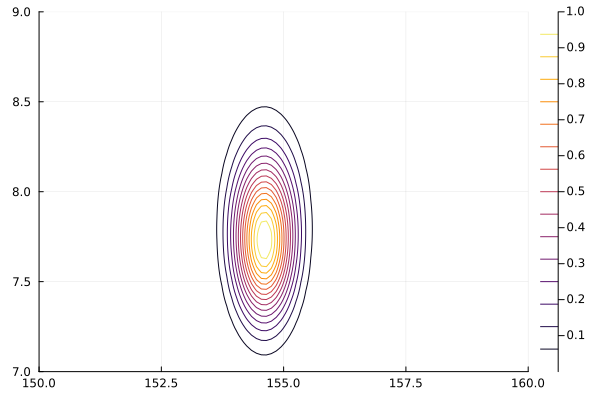

In [36]:
# note the transposition, that's due to Julia matrix order
StatsPlots.contour(μ_list, σ_list, prob')

## Code 4.18

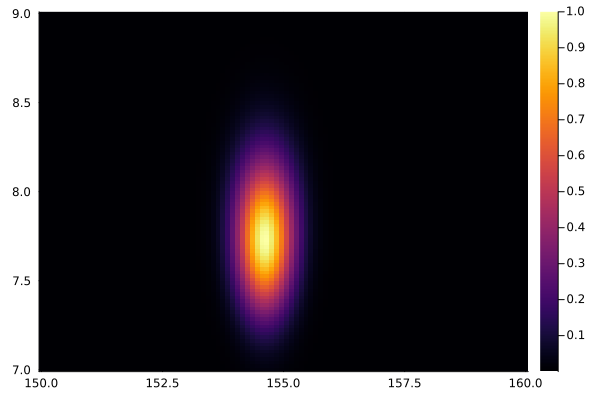

In [37]:
StatsPlots.heatmap(μ_list, σ_list, prob')

## Code 4.19

In [38]:
indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample_idx = wsample(vec(indices), vec(prob), 10_000; replace=true)
sample_μ = μ_list[first.(sample_idx)]
sample_σ = σ_list[last.(sample_idx)];

In [39]:
@show size(indices)
@show size(sample_idx)
@show size(sample_μ)

size(indices) = (100, 100)
size(sample_idx) = (10000,)
size(sample_μ) = (10000,)


(10000,)

In [40]:
indices

100×100 Matrix{Tuple{Int64, Int64}}:
 (1, 1)    (1, 2)    (1, 3)    (1, 4)    …  (1, 98)    (1, 99)    (1, 100)
 (2, 1)    (2, 2)    (2, 3)    (2, 4)       (2, 98)    (2, 99)    (2, 100)
 (3, 1)    (3, 2)    (3, 3)    (3, 4)       (3, 98)    (3, 99)    (3, 100)
 (4, 1)    (4, 2)    (4, 3)    (4, 4)       (4, 98)    (4, 99)    (4, 100)
 (5, 1)    (5, 2)    (5, 3)    (5, 4)       (5, 98)    (5, 99)    (5, 100)
 (6, 1)    (6, 2)    (6, 3)    (6, 4)    …  (6, 98)    (6, 99)    (6, 100)
 (7, 1)    (7, 2)    (7, 3)    (7, 4)       (7, 98)    (7, 99)    (7, 100)
 (8, 1)    (8, 2)    (8, 3)    (8, 4)       (8, 98)    (8, 99)    (8, 100)
 (9, 1)    (9, 2)    (9, 3)    (9, 4)       (9, 98)    (9, 99)    (9, 100)
 (10, 1)   (10, 2)   (10, 3)   (10, 4)      (10, 98)   (10, 99)   (10, 100)
 (11, 1)   (11, 2)   (11, 3)   (11, 4)   …  (11, 98)   (11, 99)   (11, 100)
 (12, 1)   (12, 2)   (12, 3)   (12, 4)      (12, 98)   (12, 99)   (12, 100)
 (13, 1)   (13, 2)   (13, 3)   (13, 4)      (13, 98)   (13, 

In [41]:
?wsample

search: wsample wsample!



```
wsample([rng], [a], w)
```

Select a weighted random sample of size 1 from `a` with probabilities proportional to the weights given in `w`. If `a` is not present, select a random weight from `w`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, n::Integer; replace=true, ordered=false)
```

Select a weighted random sample of size `n` from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. `replace` dictates whether sampling is performed with replacement. `ordered` dictates whether an ordered sample (also called a sequential sample, i.e. a sample where items appear in the same order as in `a`) should be taken.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, dims::Dims; replace=true, ordered=false)
```

Select a weighted random sample from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. The dimensions of the output are given by `dims`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).


## Code 4.20 Scatter plot of the posterior distribution of $\mu$ , $\sigma$

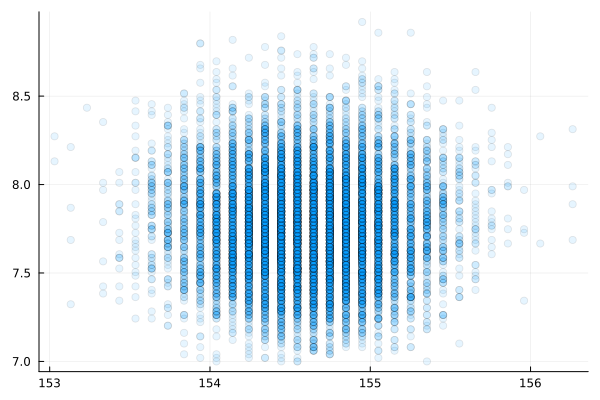

In [42]:
scatter(sample_μ, sample_σ; alpha=0.1)

## Code 4.21

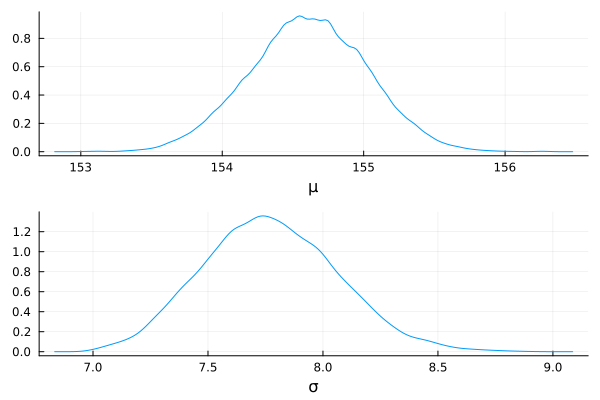

In [43]:
p1 = density(sample_μ, xaxis="μ")
p2 = density(sample_σ, xaxis="σ")
plot(p1, p2, layout=(2,1))

Pr(p|w) = (Pr(w|p)* Pr(p) )/P(w)

P(w) = \integral Pr(w, p) dp

## Code 4.22

In [44]:
println(hpdi(sample_μ, alpha=0.11))
println(hpdi(sample_σ, alpha=0.11))

[153.83838383838383, 155.15151515151516]
[7.303030303030303, 8.212121212121213]


## Code 4.23 Generate a smaller dataset with 20 individuals sampled from the whole dataset

In [45]:
d3 = sample(d2.height, 20);

## Code 4.24 Posterior $\mu$ and $\sigma$ based on the smaller dataset

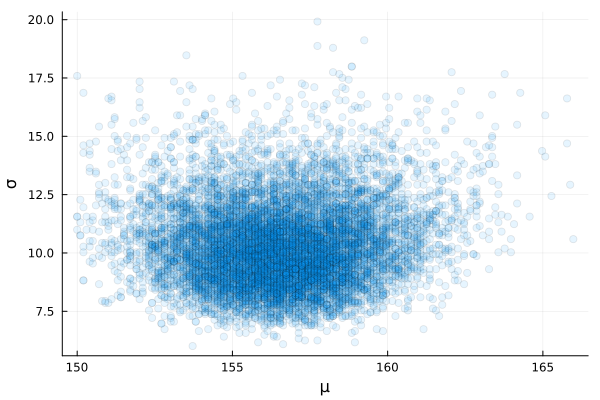

In [46]:
μ_list = range(150, 170; length=200)
σ_list = range(4, 20; length=200)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d3))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
]

max_prod = maximum(log_prod)
prob2 = @. exp(log_prod - max_prod)

indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample2_idx = wsample(vec(indices), vec(prob2), 10_000; replace=true)
sample2_μ = μ_list[first.(sample2_idx)]
sample2_σ = σ_list[last.(sample2_idx)]

scatter(sample2_μ, sample2_σ; xaxis="μ", yaxis="σ", alpha=0.1)

## Code 4.25 mean and std of estimated $\sigma$. Wider than the full dataset.

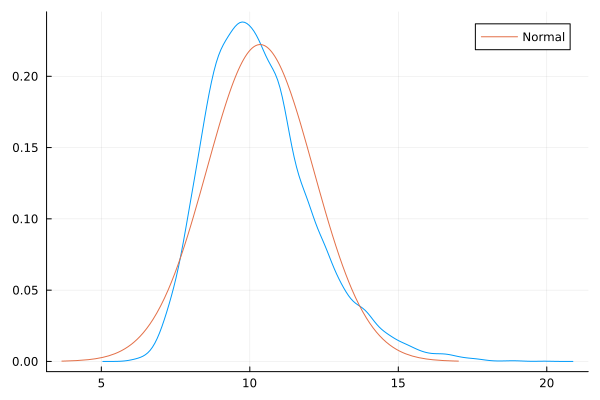

In [47]:
density(sample2_σ)
μ = mean(sample2_σ)
σ = std(sample2_σ)
plot!(Normal(μ, σ); label="Normal")

## Code 4.26 Read data/Howell1.csv

In [125]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];

## Code 4.27 The Height Bayesian Model

In [126]:
@model function model_height(height)
    μ ~ Normal(178, 20)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

model_height (generic function with 2 methods)

## Code 4.28 MCMC for the Height model

In [50]:
@time m4_1 = sample(model_height(d2.height), NUTS(), 1000)

 28.430887 seconds (35.92 M allocations: 2.275 GiB, 4.45% gc time, 98.99% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 11.71 seconds
Compute duration  = 11.71 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6016    0.4320    0.0133   1060.7819   720.0367    0.9992   ⋯
           σ     7.7513    0.2776    0.0092    876.8953   730.4635    1.0034   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 


## Code 4.29 89% credible interval of estimates

In [51]:
display.(describe(m4_1; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6016    0.4320    0.0133   1060.7819   720.0367    0.9992   ⋯
           σ     7.7513    0.2776    0.0092    876.8953   730.4635    1.0034   ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   153.8809   155.2619
           σ     7.3293     8.2069


## Code 4.30 use the mean and std from the dataset as the initial values for the MCMC

In [52]:
init_vals = [mean(d2.height), std(d2.height)]
@time chain = sample(model_height(d2.height), NUTS(), 1000, init_theta=init_vals)

  2.485025 seconds (2.17 M allocations: 152.141 MiB, 3.06% gc time, 90.19% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 1.02 seconds
Compute duration  = 1.02 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.5953    0.4196    0.0125   1125.8646   697.5749    1.0007   ⋯
           σ     7.7693    0.2998    0.0091   1083.5136   743.4487    1.0013   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.31 MCMC with a $\mu$ prior that has a smaller stddev

In [53]:
@model function model_height(height)
    μ ~ Normal(178, 0.1)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

m4_2 = sample(model_height(d2.height), NUTS(), 1000)
display.(describe(m4_2; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           μ   177.8621    0.0952    0.0035   742.0829   541.0659    1.0021    ⋯
           σ    24.6138    0.8959    0.0353   644.9296   452.3004    0.9994    ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   177.7109   178.0202
           σ    23.2345    26.0953


## Code 4.32 covariance of $\hat\mu$, $\hat\sigma$

In [54]:
cov(hcat(m4_1[:μ], m4_1[:σ]))

2×2 Matrix{Float64}:
  0.18659     -0.00541859
 -0.00541859   0.0770773

## Code 4.33  covariance and correlation of $\hat\mu$, $\hat\sigma$

In [55]:
@show c = cov(hcat(m4_1[:μ], m4_1[:σ]))
@show diag(c)
@show cov2cor(c, diag(c))

c = cov(hcat(m4_1[:μ], m4_1[:σ])) = [0.18659019895901496 -0.005418585088854244; -0.005418585088854244 0.07707730410487242]
diag(c) = [0.18659019895901496, 0.07707730410487242]
cov2cor(c, diag(c)) = [1.0 -0.37676500164200577; -0.37676500164200577 1.0]


2×2 Matrix{Float64}:
  1.0       -0.376765
 -0.376765   1.0

## Code 4.34

In [56]:
samp_chain2 = sample(m4_1, 10_000)
samp_df2 = DataFrame(samp_chain2)
@show size(samp_df2)
# check the top 5 values from this data frame
first(samp_df2, 5)

size(samp_df2) = (10000, 2)


Row,μ,σ
,Float64,Float64
1,154.279,7.88968
2,155.064,8.00078
3,154.443,7.45619
4,154.744,7.30262
5,153.651,7.81076


- 20230513 sampling from the chain directly is fixed. resetrange() is no longer needed.

  - Previously: resetrange() is needed due to bug in MCMCChains: https://github.com/TuringLang/MCMCChains.jl/issues/324
  - Once it will be fixed, direct sampling from the chain will be possible

In [57]:
samp_chain = sample(resetrange(m4_1), 10_000)
samp_df = DataFrame(samp_chain)
first(samp_df, 5)

Row,μ,σ
,Float64,Float64
1,154.811,7.09024
2,154.063,8.56871
3,154.187,8.10972
4,153.745,7.55443
5,154.923,8.10891


In [58]:
?resetrange

search: resetrange register_interaction! deregister_interaction!



```
resetrange(chains::Chains)
```

Generate a new chain from `chains` with iterations indexed by `1:n`, where `n` is the number of samples per chain.

The new chain and `chains` share the same data in memory.


In [59]:
parentmodule(resetrange)

MCMCChains

In [60]:
precis(samp_df2)

┌───────┬────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%   histogram │
├───────┼────────────────────────────────────────────────────────┤
│     μ │ 154.602  0.4276  153.881  154.615  155.252     ▁▂▇█▄▁▁ │
│     σ │  7.7483  0.2766   7.3203   7.7411   8.2037  ▁▁▃▆█▇▄▂▁▁ │
└───────┴────────────────────────────────────────────────────────┘


## Code 4.35 summarizing the estimates

In [61]:
precis(samp_df)

┌───────┬──────────────────────────────────────────────────────┐
│ param │  mean     std     5.5%      50%    94.5%   histogram │
├───────┼──────────────────────────────────────────────────────┤
│     μ │ 154.6  0.4314  153.881  154.615  155.269     ▁▂▇█▄▁▁ │
│     σ │ 7.752  0.2773   7.3342   7.7498   8.2206  ▁▁▃▆██▄▂▁▁ │
└───────┴──────────────────────────────────────────────────────┘


In [62]:
parentmodule(precis)

StatisticalRethinking

## Code 4.36 sample from multi-variate normal

In [63]:
data = hcat(m4_1[:μ], m4_1[:σ])
@show size(data)
@show μ = mean(data, dims=1)
@show σ = cov(data)
@show mvn = MvNormal(vec(μ), σ)
post = rand(mvn, 10_000);
print(mvn)

size(data) = (1000, 2)
μ = mean(data, dims = 1) = [154.60155721156596 7.751270946270483]
σ = cov(data) = [0.18659019895901496 -0.005418585088854244; -0.005418585088854244 0.07707730410487242]
mvn = MvNormal(vec(μ), σ) = FullNormal(
dim: 2
μ: [154.60155721156596, 7.751270946270483]
Σ: [0.18659019895901496 -0.005418585088854244; -0.005418585088854244 0.07707730410487242]
)

FullNormal(
dim: 2
μ: [154.60155721156596, 7.751270946270483]
Σ: [0.18659019895901496 -0.005418585088854244; -0.005418585088854244 0.07707730410487242]
)


# 4.4 Linear predictions

## Code 4.37 fancy way of doing scatter(d2.weight, d2.height)

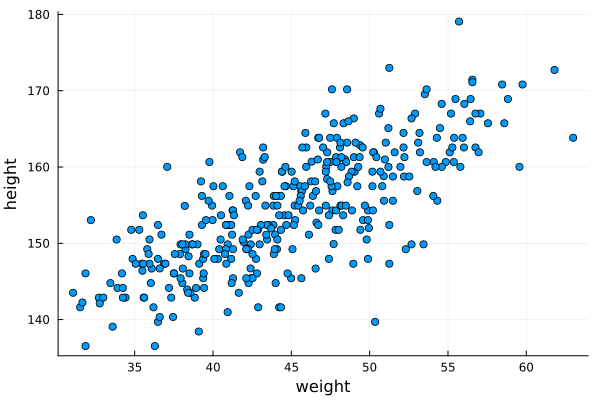

In [202]:
d_howell = DataFrame(CSV.File("data/Howell1.csv"));
d_howell_18 = d_howell[d_howell.age .>= 18,:];
# fancy way of doing scatter(d2.weight, d2.height)
@df d_howell_18 scatter(:weight, :height, xaxis="weight", yaxis="height")

## Code 4.38 Prior predictive simulation

In [65]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(Normal(0, 10), N);

## Code 4.39 Draw different prior predictive simulations

In [66]:
extrema(d2.weight)

(31.071052, 62.992589)

In [67]:
parentmodule(extrema)

Base

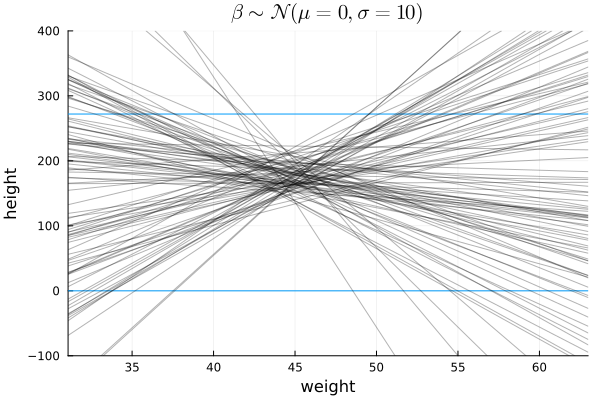

In [68]:
p = hline([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="height")
title!(L"\beta \sim \mathcal{N}(\mu=0,\sigma=10)")

x_mean = mean(d2.weight)
xlims = extrema(d2.weight)  # getting min and max in one pass

for (α, β) ∈ zip(α_vec, β_vec)
    plot!(x -> α + β * (x - x_mean); xlims=xlims, c=:black, alpha=0.3)
end
display(p)

## Code 4.40 log-normal for $\beta$.

- log($\beta$) ~ Normal(0,1).
- $\beta$ ~ $exp^{Normal(0,1)}$

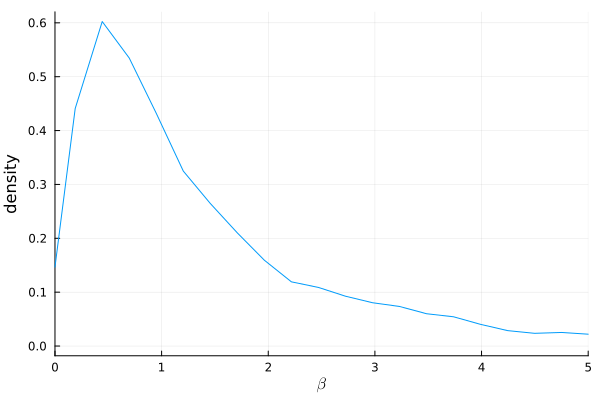

In [69]:
β_vec = rand(LogNormal(0, 1), 10_000)
density(β_vec, xlims=(0, 5), bandwidth=0.02, xaxis=L"\beta", yaxis="density")

## Code 4.41 Prior of $\beta$ in LogNormal

In [70]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(LogNormal(0, 1), N);

## Code 4.42 MCMC Sampling (Model fitting)

In [71]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:]
xbar = mean(d2.weight)

@model function height_regr_model(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    μ = @. α + β * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3 = sample(height_regr_model(d2.weight, d2.height), NUTS(), 1000)
@time m4_3 = resetrange(m4_3);
m4_3

 11.737738 seconds (12.94 M allocations: 1008.067 MiB, 3.77% gc time, 95.26% compilation time)
  0.000009 seconds (1 allocation: 96 bytes)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 8.84 seconds
Compute duration  = 8.84 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.6166    0.2760    0.0087   1011.7890   659.6991    0.9992   ⋯
           β     0.9043    0.0428    0.0013   1102.9364   568.4875    0.9994   ⋯
           σ     5.1036    0.1958    0.0047   1724.2906   672.3186    1.0028   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%    

## Code 4.43 Put exponential into $\beta$

In [72]:
xbar = mean(d2.weight)

@model function height_regr_model_exp(weight, height)
    α ~ Normal(178, 20)
    log_β ~ Normal(0, 1)
    μ = @. α + exp(log_β) * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3b = sample(height_regr_model_exp(d2.weight, d2.height), NUTS(), 1000);
m4_3b

  8.433743 seconds (7.78 M allocations: 690.084 MiB, 3.68% gc time, 93.90% compilation time)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 6.27 seconds
Compute duration  = 6.27 seconds
parameters        = α, log_β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.5856    0.2703    0.0064   1726.0722   913.1488    1.0001   ⋯
       log_β    -0.1015    0.0451    0.0013   1226.3122   815.1867    1.0012   ⋯
           σ     5.1073    0.1930    0.0050   1528.9530   740.2345    0.9998   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      7

In [73]:
exp(-0.0994)

0.9053804833900955

## Code 4.44 summarize the model estimates, mean, std, 89% CI, histogram

In [74]:
m4_3_df = DataFrame(m4_3)
precis(m4_3_df)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std    5.5%      50%   94.5%       histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     α │ 154.617   0.276  154.17  154.619  155.06      ▁▁▂▄██▅▂▁▁ │
│     β │  0.9043  0.0428  0.8323   0.9035  0.9714          ▁▂▇█▃▁ │
│     σ │  5.1036  0.1958  4.8045   5.0984  5.4276  ▁▁▂▅▆██▆▄▃▁▁▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


## Code 4.45 Covariance among parameters

In [75]:
round.(cov(Matrix(m4_3_df)), digits=3)

3×3 Matrix{Float64}:
  0.076  -0.0     0.003
 -0.0     0.002  -0.0
  0.003  -0.0     0.038

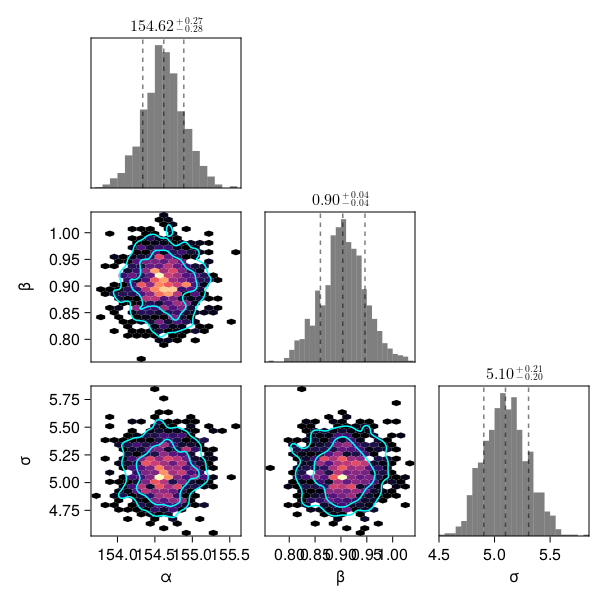

In [76]:
pairplot(
    m4_3_df => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.46 Posterior inteference of average height

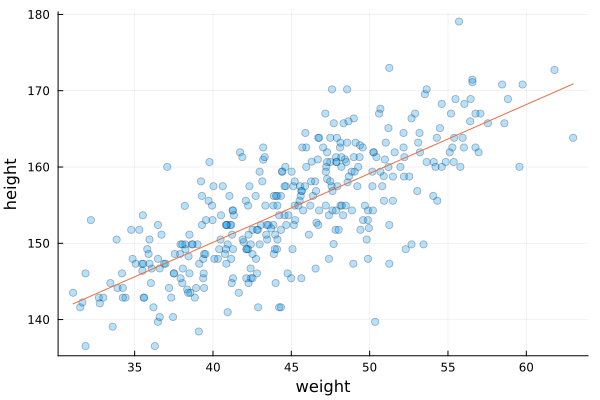

In [77]:
p = @df d2 scatter(:weight, :height; alpha=0.3, xaxis="weight", yaxis="height")

chain = resetrange(m4_3)
samples = sample(chain, 1000)

α_map = mean(samples[:α])
β_map = mean(samples[:β])
plot!(x -> α_map + β_map*(x-xbar))

## Code 4.47 DataFrame of posterior values of parameters

In [78]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
post_df[1:5,:]

Row,α,β,σ
,Float64,Float64,Float64
1,154.783,0.882017,5.46049
2,154.729,0.830759,5.00458
3,154.31,0.898603,4.92338
4,154.559,0.900764,5.19896
5,155.122,0.923524,4.95153


## Code 4.48 MCMC-Sample again with 10 samples

In [79]:
N = 10
dN = d2[1:N,:]

@model function height_regr_model_N(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    m_weight = mean(weight)
    μ = @. α + β * (weight - m_weight)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time mN = sample(height_regr_model(dN.weight, dN.height), NUTS(), 1000)
mN = resetrange(mN);
mN

  0.399144 seconds (1.16 M allocations: 109.666 MiB, 16.21% gc time)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.38 seconds
Compute duration  = 0.38 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           α   152.1810    1.8375    0.0848   500.2283   439.0312    1.0012    ⋯
           β     0.9185    0.1847    0.0072   661.3325   492.8463    0.9995    ⋯
           σ     5.7712    1.9896    0.0977   498.9190   475.0011    0.9997    ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%    

## Code 4.49 Visualize the Model uncertainty with only 10 samples

In [80]:
post = sample(mN, 20)
size(post)
post
post_df = DataFrame(post);
post_df

Row,α,β,σ
,Float64,Float64,Float64
1,151.667,0.810842,4.29984
2,152.145,1.07724,7.72862
3,153.252,0.709772,4.87801
4,151.442,1.01577,3.04268
5,152.612,0.888339,3.72393
6,149.768,0.861739,4.06062
7,153.626,1.15642,6.03119
8,152.169,1.00246,4.46589
9,150.107,0.989003,4.65175


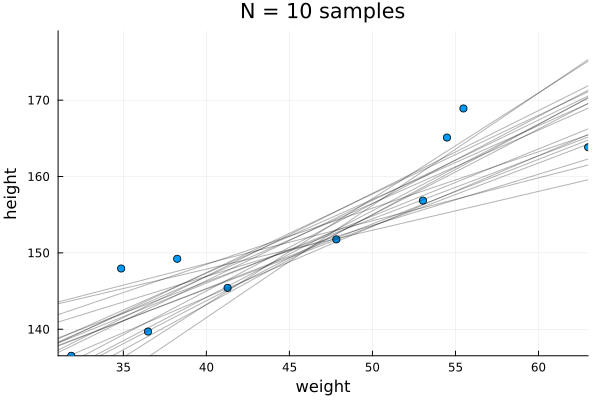

In [81]:
post = sample(mN, 20)
post_df = DataFrame(post);

xlims = extrema(d2.weight)
ylims = extrema(d2.height)
p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims)
title!("N = $N samples"; xlab="weight", ylab="height")

x_mean = mean(dN.weight)
for (α, β) ∈ zip(post_df.α, post_df.β)
    plot!(x -> α + β * (x-x_mean); c="black", alpha=0.3)
end
display(p)

## Code 4.50 The mean height corresponding to weight=50kg

In [82]:
# sample 1000 sets of model parameters from the fitted model
post = sample(m4_3, 1000)
post_df = DataFrame(post)

@time μ_at_50 = @. post_df.α + post_df.β * (50 - xbar);
# 1000 samples for the estimated mean height for weight = 50kg
μ_at_50

  0.155992 seconds (161.38 k allocations: 10.672 MiB, 98.35% compilation time)


1000-element Vector{Float64}:
 158.69011860811418
 159.71236198890395
 159.30247470355707
 159.00461641102308
 158.9956303613232
 159.7808885119814
 159.15583857726247
 159.33204101166294
 159.3686294360434
 158.96927867055865
 159.11455357967512
 158.96986804777103
 159.36886440908205
   ⋮
 159.5652826931974
 159.41743370041937
 158.76438723199666
 159.17588208892582
 159.25123089133717
 159.31407130412478
 158.73458805729368
 159.26866408794604
 159.0515141257084
 159.31407130412478
 158.8200082866103
 158.9051459037894

### Code 4.51 Histogram of the height for weight=50kg

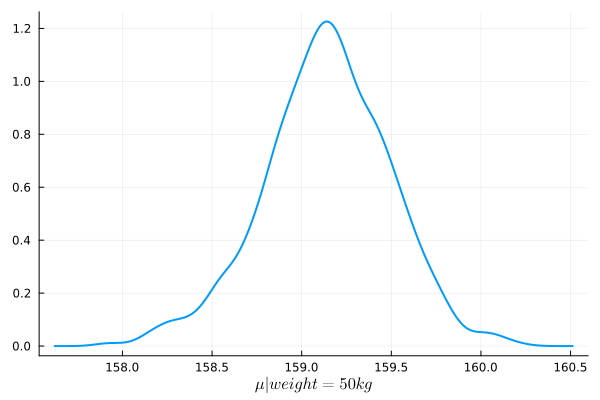

In [123]:
density(μ_at_50; lw=2, xlab=L"\mu|weight=50kg")

### Code 4.52  89% CI of height for weight=50kg

In [118]:
PI(μ_at_50)

2-element Vector{Float64}:
 158.54465828486605
 159.6821335067655

In [119]:
parentmodule(PI)

StatisticalRethinking

## Code 4.53 Confidence interval for the mean height at different weights

In [206]:
@show size(post_df)
first(post_df, 3)

size(post_df) = (1000, 3)


Row,α,β,σ
,Float64,Float64,Float64
1,154.526,0.831262,5.56907
2,155.036,0.93356,5.21992
3,154.641,0.93059,4.8649


In [162]:
μ = StatisticalRethinking.link(post_df, [:α :β], d2.weight, xbar);
@show size(μ)
μ = hcat(μ...);
@show size(μ)
μ[1:5,1]

size(μ) = (352,)
size(μ) = (1000, 352)


5-element Vector{Float64}:
 156.88262837065798
 157.68243604929282
 157.2790063918325
 156.98177635360258
 157.0142764763409

### Code 4.54 Confidence interval for the mean height for weight from 25 to 70kg

In [203]:
weight_seq = 25:70
μ = StatisticalRethinking.link(post_df, [:α :β], weight_seq, xbar);
μ = hcat(μ...);
@show Base.size(μ)
μ[1:5,1]

Base.size(μ) = (1000, 46)


5-element Vector{Float64}:
 137.9085738065845
 136.37337183358994
 136.03773085976127
 135.74709589529635
 136.2150954100565

### Code 4.55 Plot the mean height vs weight

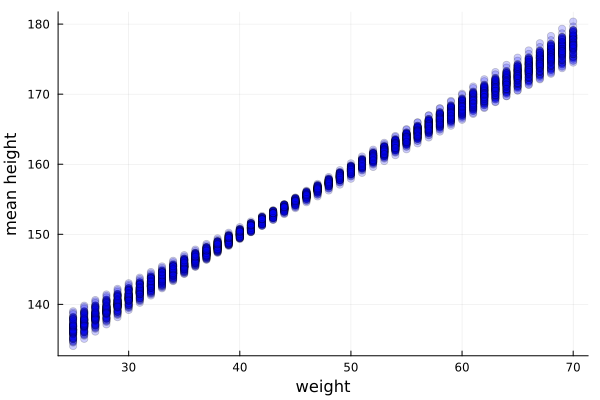

In [204]:
p = plot()
for i in 1:100
    Plots.scatter!(weight_seq, μ[i,:]; c=:blue, alpha=0.2, xaxis="weight", yaxis="mean height")
end
display(p)

### Code 4.56 89% CI of mean height at each weight

In [139]:
@show size(μ)
μ_mean = mean.(eachcol(μ))
@show size(μ_mean)
μ_PI = PI.(eachcol(μ))
@show size(μ_PI)
@show first(μ_PI, 3)
@show typeof(μ_PI)
@show size(μ_PI')
μ_PI = vcat(μ_PI'...);
μ_PI

size(μ) = (1000, 46)
size(μ_mean) = (46,)
size(μ_PI) = (46,)
first(μ_PI, 3) = [[135.0252140309056, 138.12176381428384], [135.9985871647355, 138.94284620359173], [136.97713399933704, 139.76838486867632]]
typeof(μ_PI) = Vector{Vector{Float64}}
size(μ_PI') = (1, 46)


46×2 Matrix{Float64}:
 135.025  138.122
 135.999  138.943
 136.977  139.768
 137.956  140.609
 138.93   141.439
 139.892  142.266
 140.865  143.092
 141.838  143.935
 142.811  144.773
 143.768  145.609
 144.716  146.439
 145.663  147.283
 146.621  148.138
   ⋮      
 166.256  168.323
 167.106  169.294
 167.936  170.279
 168.79   171.25
 169.644  172.23
 170.489  173.209
 171.315  174.188
 172.141  175.15
 172.967  176.136
 173.793  177.121
 174.632  178.088
 175.478  179.064

### Code 4.57 Plot the raw data, 89% CI of mean height at different weight

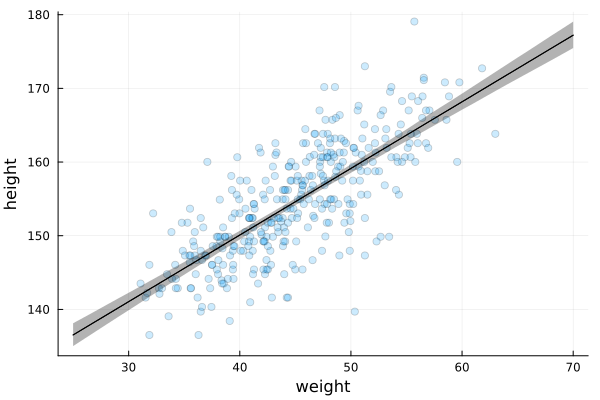

In [132]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
Plots.plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)

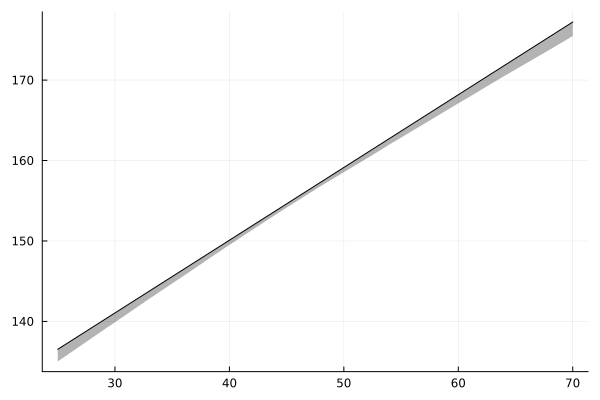

In [146]:
Plots.plot(weight_seq, μ_mean; c=:black, fillrange=μ_PI, fillalpha=0.3)

In [144]:
@show size([μ_mean μ_mean])

size([μ_mean μ_mean]) = (46, 2)


(46, 2)

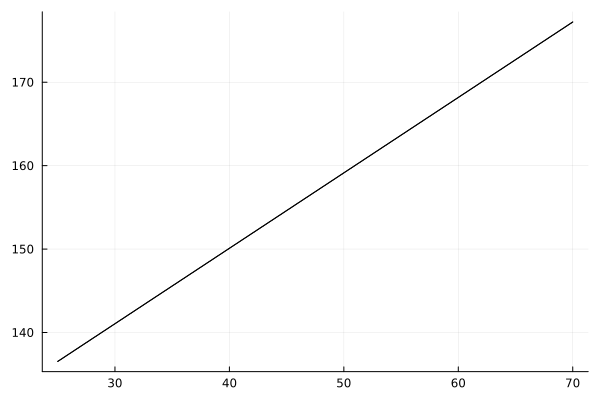

In [142]:
Plots.plot(weight_seq, [μ_mean μ_mean]; c=:black)

## Code 4.58 Unpack what StatisticalThinking.link() is doing.

In [153]:
post = sample(m4_3, 1000)
post = DataFrame(post)
@show size(post)
@show first(post, 3)
weight_seq = 25:70
μ = map(w -> post.α + post.β * (w - xbar), weight_seq)
@show size(μ)
@show typeof(μ)
μ = hcat(μ...)
@show size(μ)
@show typeof(μ)

μ_mean = mean.(eachcol(μ))
μ_CI = PI.(eachcol(μ));
μ_CI

size(post) = (1000, 3)
first(post, 3) = 3×3 DataFrame
 Row │ α        β         σ
     │ Float64  Float64   Float64
─────┼────────────────────────────
   1 │ 154.603  0.884394  5.24272
   2 │ 155.044  0.897267  5.08514
   3 │ 154.328  0.853202  5.16914
size(μ) = (46,)
typeof(μ) = Vector{Vector{Float64}}
size(μ) = (1000, 46)
typeof(μ) = Matrix{Float64}


46-element Vector{Vector{Float64}}:
 [135.09039855891197, 138.1436690087413]
 [136.06481085899316, 138.97894461691996]
 [137.0392231590743, 139.81020273096883]
 [137.99383374957912, 140.64359308032525]
 [138.94691451741198, 141.48319705815985]
 [139.9247437527704, 142.31610565403236]
 [140.88377764483852, 143.14783996596347]
 [141.8536601073679, 143.9741003893156]
 [142.82354332177636, 144.8033258989858]
 [143.78528277945858, 145.6268724753794]
 [144.75768373288682, 146.46659710849246]
 [145.70260598876098, 147.2952804046935]
 [146.64832535843573, 148.13260713379094]
 ⋮
 [166.20506356692098, 168.25137225809505]
 [167.03818145052267, 169.22967835105598]
 [167.86084770621574, 170.21138706640036]
 [168.69765431332567, 171.19309578174472]
 [169.54273192043985, 172.163448512415]
 [170.35506813811162, 173.14068668097278]
 [171.1680875964906, 174.12497903945822]
 [172.00000306160837, 175.09472924196393]
 [172.85033674998954, 176.05044198812985]
 [173.7042728365736, 177.0193876453497]
 [174.53

## Code 4.59 89% CI of predicted height (not average height) via simulation at each weight

In [156]:
sim_height = simulate(post, [:α, :β, :σ], weight_seq .- xbar);
@show Base.size(sim_height)
sim_height[1:5,1]

Base.size(sim_height) = (1000, 46)


5-element Vector{Float64}:
 141.33075048521627
 135.57624521299596
 131.4196512792524
 142.8863413121892
 142.79120603058476

In [158]:
parentmodule(simulate)

StatisticalRethinking

### Code 4.60 89% CI of predicted height

In [164]:
height_PI = PI.(eachcol(sim_height))
@show size(height_PI)
@show size(height_PI');

@show size(vcat(height_PI...));

height_PI = vcat(height_PI'...);
@show size(height_PI)
first(height_PI, 3)

size(height_PI) = (46,)
size(height_PI') = (1, 46)
size(vcat(height_PI...)) = (92,)
size(height_PI) = (46, 2)


3-element Vector{Float64}:
 128.27146115676786
 128.89800647731158
 130.0206653036747

### Code 4.61 89% CI of average/mean height and predicted height

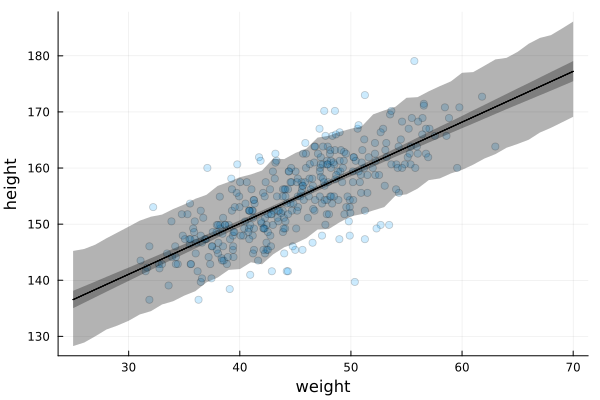

In [165]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

### Code 4.62 Smoother plot for 89% CI of average/mean height and height

In [168]:
# sample 10X more for model parameters
post = sample(m4_3, 10_000)
post = DataFrame(post)
sim_height = simulate(post, [:α, :β, :σ], weight_seq .- xbar)
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

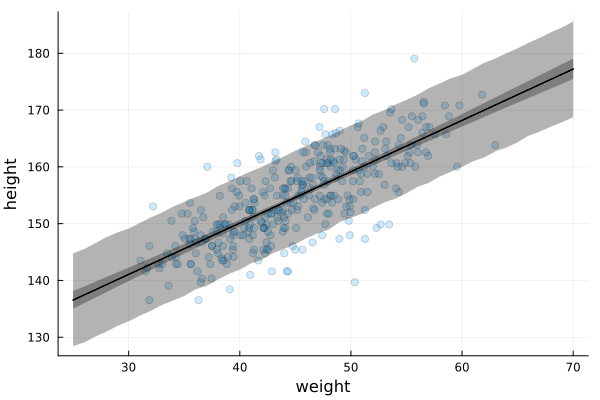

In [167]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.63 Unpack what StatisticalRethinking.simulate() is doing.

In [169]:
post = sample(m4_3, 1000)
post = DataFrame(post)

sim_height = [
    [
        rand(Normal(α + β * (w - xbar), σ))
        for (α, β, σ) ∈ zip(post.α, post.β, post.σ)
    ]
    for w ∈ weight_seq
]
sim_height = hcat(sim_height...)

height_PI = PI.(eachcol(sim_height));
height_PI = vcat(height_PI'...);

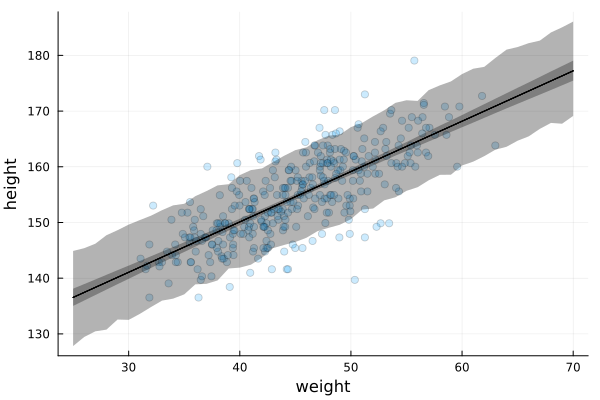

In [170]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

# 4.5 Curves from lines

## Code 4.64 Height vs Weight for all people (including age<18).

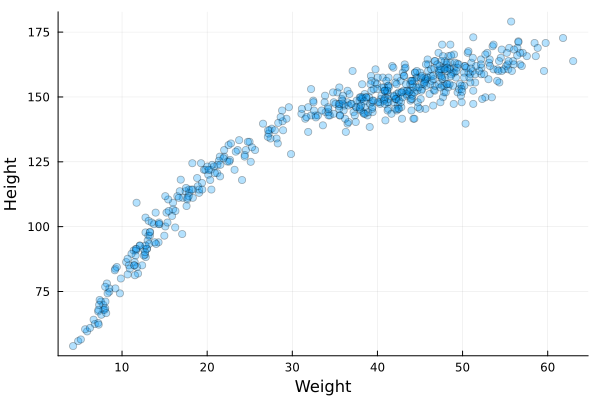

In [99]:
d = DataFrame(CSV.File("data/Howell1.csv"))
scatter(d.weight, d.height; alpha=0.3, xaxis="Weight", yaxis="Height")

## Code 4.65 Polynomial (quadratic) regression 

In [172]:
d[!, :weight_s] = standardize(ZScoreTransform, d.weight)
d[!, :weight_s2] = d.weight_s.^2;

@model function height_regr_m2(weight_s, weight_s2, height)
    α ~ Normal(178, 20)
    β1 ~ LogNormal(0, 1)
    β2 ~ Normal(0, 1)
    μ = @. α + β1 * weight_s + β2 * weight_s2
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_5 = sample(height_regr_m2(d.weight_s, d.weight_s2, d.height), NUTS(), 1000)
m4_5 = resetrange(m4_5)
m4_5_df = DataFrame(m4_5);

  3.569545 seconds (2.88 M allocations: 725.496 MiB, 4.90% gc time, 78.44% compilation time: 86% of which was recompilation)


### Code 4.66 Describe the fitted parameters

In [173]:
precis(m4_5_df)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%     histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     α │ 146.037  0.3563  145.476  146.033  146.601  ▁▁▂▃▆██▇▅▂▁▁ │
│    β1 │ 21.7532  0.2827  21.2986  21.7501  22.2008   ▁▁▁▃▆█▇▄▂▁▁ │
│    β2 │ -7.7873  0.2601  -8.1957  -7.7894  -7.3789    ▁▁▂▅██▅▂▁▁ │
│     σ │  5.8033  0.1789   5.5236   5.7997   6.0955  ▁▁▂▄▆██▇▃▂▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


### Code 4.67 Compute the 89% CI of average height and height

In [174]:
Random.seed!(1)
df = sample(m4_5_df, 1000)
weight_seq = range(-2.2, 2; length=30)

mu = StatisticalRethinking.link(df, (r, x) -> r.α + r.β1*x + r.β2*x^2, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

sim_height = simulate(df, (r, x) -> Normal( r.α + r.β1*x + r.β2*x^2, r.σ), weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

### Code 4.68 Plot the 89% CI of average height and height

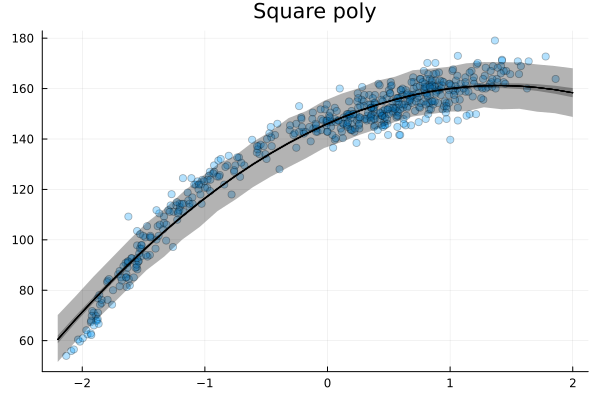

In [175]:
p_square = @df d scatter(:weight_s, :height; alpha=0.3, title="Square poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.69 Cubic regression

In [176]:
d[!, :weight_s3] = d.weight_s.^3;

@model function height_regr_m3(weight_s, weight_s2, weight_s3, height)
    α ~ Normal(178, 20)
    β1 ~ LogNormal(0, 1)
    β2 ~ Normal(0, 1)
    β3 ~ Normal(0, 1)
    μ = @. α + β1 * weight_s + β2 * weight_s2 + β3 * weight_s3
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_6 = sample(height_regr_m3(d.weight_s, d.weight_s2, d.weight_s3, d.height), NUTS(), 1000)
m4_6 = resetrange(m4_6)
m4_6_df = DataFrame(m4_6)
precis(m4_6_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%    histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     α │ 146.372  0.3122  145.885  146.373  146.869  ▁▁▄▇██▆▃▁▁▁ │
│    β1 │ 15.2078  0.4791  14.3973  15.2224  15.9425      ▁▂▅█▅▁▁ │
│    β2 │ -6.1942  0.2637  -6.6265  -6.1922  -5.7831   ▁▁▂▅██▅▂▁▁ │
│    β3 │  3.5907  0.2292   3.2126   3.5894   3.9745     ▁▂▅██▄▂▁ │
│     σ │  4.8573  0.1498   4.6336   4.8488   5.1027  ▁▁▄▇█▆▄▂▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


In [178]:
Random.seed!(1)
df = sample(m4_6_df, 1000)
#new z-scored weight_seq
weight_seq = range(-2.2, 2; length=30)

func = (r, x) -> r.α + r.β1*x + r.β2*x^2 + r.β3*x^3
mu = StatisticalRethinking.link(df, func, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

func = (r, x) -> Normal(r.α + r.β1*x + r.β2*x^2 + r.β3*x^3, r.σ)
sim_height = simulate(df, func, weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

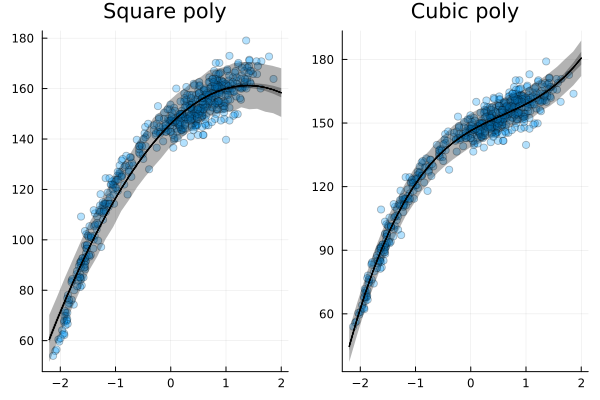

In [179]:
p_cubic = @df d scatter(:weight_s, :height; alpha=0.3, title="Cubic poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

plot(p_square, p_cubic; layout=(1, 2))

### Code 4.70 and 4.71 Back to the original scale

Looks like Julia plots don't support change of ticks proposed in the book.
But much more natural way will be to remap values we're plotting back to the original scale.
Example of this is below.

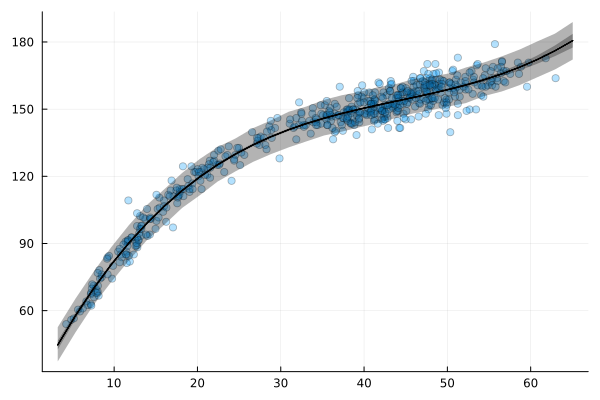

In [181]:
μ = mean(d.weight)
σ = std(d.weight)
w = @.  μ + d.weight_s * σ
scatter(w, d.height; alpha=0.3)

w_s = @. μ + weight_seq * σ
plot!(w_s, mu_mean; c=:black)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.72 Japan Cherry Blossom data

In [186]:
d_blossom = DataFrame(CSV.File("data/cherry_blossoms.csv", missingstring="NA"))
precis(d_blossom)

┌────────────┬─────────────────────────────────────────────────────────┐
│      param │   mean      std    5.5%     50%    94.5%      histogram │
├────────────┼─────────────────────────────────────────────────────────┤
│       year │ 1408.0  350.885  867.77  1408.0  1948.23  ████████████▂ │
│        doy │ 104.54    6.407   94.43   105.0    115.0       ▁▂▆██▅▂▁ │
│       temp │ 6.1419   0.6636    5.15     6.1   7.2947       ▁▄▆█▄▂▁▁ │
│ temp_upper │ 7.1852   0.9929  5.8977    7.04   8.9023       ▂██▃▁▁▁▁ │
│ temp_lower │ 5.0989   0.8503  3.7876   5.145     6.37       ▁▁▁▂▇█▂▁ │
└────────────┴─────────────────────────────────────────────────────────┘


### Code 4.73 Generate 15 knots (15 quantiles across years)

In [187]:
d2_blossom = d_blossom[completecases(d_blossom[!,[:doy]]),:]
d2_blossom = disallowmissing(d2_blossom[!,[:year,:doy]])
num_knots = 15
knots_list = quantile(d2_blossom.year, range(0, 1; length=num_knots));

### Code 4.74 degree-3 B-splines

In [188]:
using BSplines

basis = BSplineBasis(3, knots_list)

16-element BSplineBasis{Vector{Float64}}:
 order: 3
 breakpoints: [812.0, 1036.0, 1174.0, 1269.0, 1377.0, 1454.0, 1518.0, 1583.0, 1650.0, 1714.0, 1774.0, 1833.0, 1893.0, 1956.0, 2015.0]

### Code 4.75 Plot the 15 B-splines

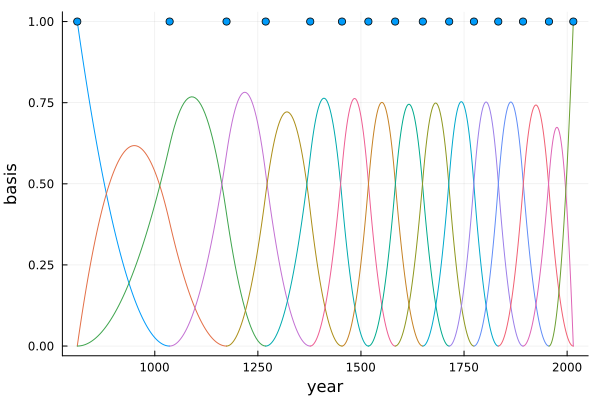

In [184]:
p1 = plot(basis)
Plots.scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis", legend=false)

## Code 4.76 MCMC fit the B-spline model

This way of calculating bsplines is slightly slower, than shown in the book (with pre-calculated matrix) but it is much cleaner in my perspective.

You can do comparison yourself by precalculating spline matrix outside of the model and do matrix multiplication in the model instead of spline evialutaion. Example of doing this is at code block 4.79

In [189]:
@model function model_splines(year, doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    s = Spline(basis, w)
    μ = a .+ s.(year)
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

@time m4_7 = sample(model_splines(d2_blossom.year, d2_blossom.doy), NUTS(0.65; init_ϵ = 9.765625e-5), 1000)
m4_7

 23.912481 seconds (39.34 M allocations: 15.695 GiB, 18.52% gc time, 17.10% compilation time: 89% of which was recompilation)


Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 22.43 seconds
Compute duration  = 22.43 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

        w[1]    -0.6878    0.9214    0.0171   2881.9960   865.8623    1.0019   ⋯
        w[2]    -0.8564    0.8392    0.0191   1951.7428   878.3375    0.9995   ⋯
        w[3]     0.8400    0.7910    0.0175   2061.2967   875.7593    0.9994   ⋯
        w[4]     0.6930    0.7489    0.0164   

### Code 4.77 Plot the weighted basis function

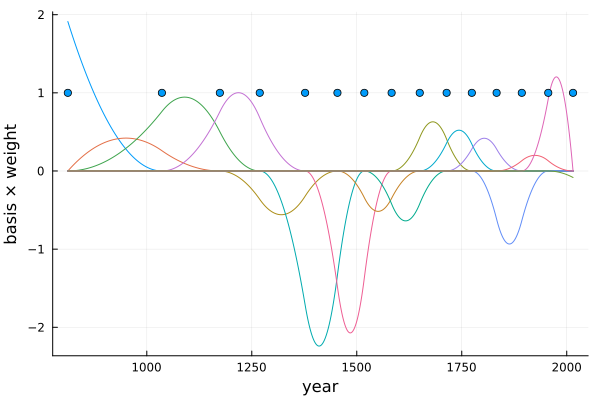

In [192]:
post_blossom = DataFrame(m4_7)

# convert columns w[*] into single column w
w_df = DataFrames.select(post_blossom, r"w")
post_blossom = DataFrames.select(post_blossom, Not(r"w"))
post_blossom[!,:w] = Vector.(eachrow(w_df))

# vector of 16 average w values
w_mean = mean.(eachcol(w_df))
p2 = plot(basis .* w_mean)
Plots.scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis × weight")

### Code 4.78 89% CI of mean days and days

In [193]:
first(post_blossom, 3)

Row,a,σ,w
,Float64,Float64,Array…
1,105.175,6.15466,"[1.6777, 0.120459, 1.14119, 0.801027, -1.41583, -2.94966, -3.78472, -0.649887, -1.79458, 0.821595, -0.191302, 1.4745, -3.69347, 0.380811, 1.56964, -1.45691]"
2,103.898,5.91096,"[3.70408, 1.84278, 1.37471, 1.82319, -0.291693, -2.48189, -1.45649, -0.697127, 0.314738, 0.762852, 1.28887, -0.996654, 1.00542, -0.286246, 2.0561, 1.45019]"
3,104.21,6.37708,"[0.772615, -0.781496, 0.947871, 0.44595, -0.249155, -2.47369, -2.83675, -0.092495, -1.43466, 0.903594, 1.31434, 0.924137, -1.78276, 0.430258, 1.85321, -0.112459]"


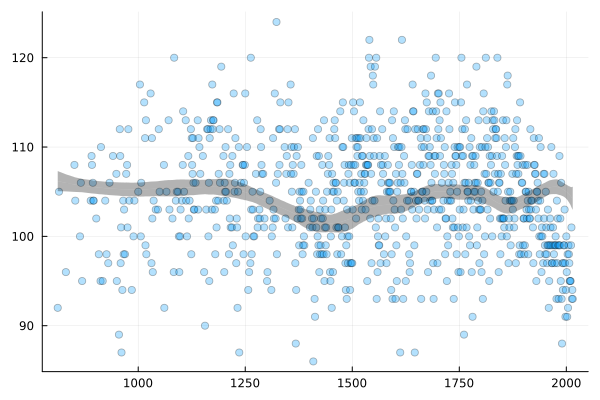

In [194]:
μ = StatisticalRethinking.link(post_blossom, (r, x) -> r.a + Spline(basis, r.w)(x), d2_blossom.year)
μ = vcat(μ'...);

μ_PI = PI.(eachrow(μ))
μ_PI = vcat(μ_PI'...);

p3 = @df d2_blossom scatter(:year, :doy; alpha=0.3)
μ_mean = mean.(eachrow(μ_PI))
Plots.plot!(d2_blossom.year, [μ_mean, μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3, alpha=0)

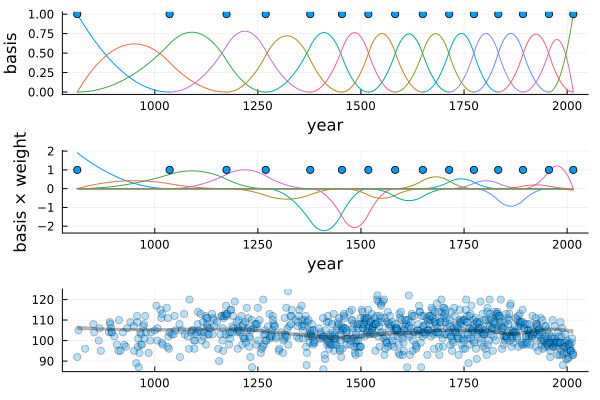

In [195]:
plot(p1, p2, p3; layout=(3, 1))

## Code 4.79 How to build the model with explicit spline matrix calculation

In [207]:
basis = BSplineBasis(3, knots_list)

# list of splines with 1 only at corresponding basis index
splines = [
    Spline(basis, [float(idx == knot) for idx ∈ 1:length(basis)])
    for knot ∈ 1:length(basis)
]

@show size(splines)

# calculate each spline for every year. Resulting matrix B is 827x16
B = [
    map(s -> s(year), splines)
    for year in d2_blossom.year
]
@show size(B)

B = vcat(B'...);

@show size(B)

# do not need years parameter anymore, all the information is in B matrix
@model function model_splines_matrix(doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    μ = a .+ B * w
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

@time m4_7alt = sample(model_splines_matrix(d2_blossom.doy), NUTS(0.65; init_ϵ = 0.0001953125), 1000)
m4_7alt

size(splines) = (16,)
size(B) = (827, 16)
 10.317697 seconds (4.73 M allocations: 9.187 GiB, 11.94% gc time, 32.15% compilation time: 88% of which was recompilation)


Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 9.2 seconds
Compute duration  = 9.2 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

        w[1]    -0.6880    0.9417    0.0211   1975.3482   662.6857    0.9993   ⋯
        w[2]    -0.8457    0.9017    0.0194   2153.2451   613.4144    1.0018   ⋯
        w[3]     0.8098    0.7869    0.0202   1510.0255   823.2507    1.0040   ⋯
        w[4]     0.6912    0.7611    0.0197   1500